In [38]:
!pip install kaggle


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [39]:
!mkdir -p ~/.kaggle 
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [40]:
!kaggle datasets download -d omkargurav/face-mask-dataset

face-mask-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [41]:
#extracting kaggle dataset
from zipfile import ZipFile
dataset = '/content/face-mask-dataset.zip'
with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


**importing dependencies**

In [42]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
from sklearn.model_selection import train_test_split

In [43]:
with_mask_files = os.listdir('/content/data/with_mask')
print(with_mask_files[0:5])
print(with_mask_files[-5:])

['with_mask_416.jpg', 'with_mask_2057.jpg', 'with_mask_1311.jpg', 'with_mask_1843.jpg', 'with_mask_401.jpg']
['with_mask_224.jpg', 'with_mask_2485.jpg', 'with_mask_3284.jpg', 'with_mask_1279.jpg', 'with_mask_2283.jpg']


In [44]:
without_mask_files = os.listdir('/content/data/without_mask')
print(without_mask_files[0:5])
print(without_mask_files[-5:])

['without_mask_204.jpg', 'without_mask_1611.jpg', 'without_mask_526.jpg', 'without_mask_466.jpg', 'without_mask_2439.jpg']
['without_mask_2954.jpg', 'without_mask_1826.jpg', 'without_mask_1176.jpg', 'without_mask_2888.jpg', 'without_mask_339.jpg']


In [45]:
print('Number of with mask images',len(with_mask_files))
print('Number of without mask images',len(without_mask_files))

Number of with mask images 3725
Number of without mask images 3828


**Creating labels for tow type of images**

In [46]:
with_mask_labels = [1]*len(with_mask_files)
without_mask_labels = [0]*len(without_mask_files)

In [47]:
print(with_mask_labels[0:5])
print(without_mask_labels[0:5])

[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


In [48]:
print(len(with_mask_labels))
print(len(without_mask_labels))

3725
3828


In [49]:
labels = with_mask_labels + without_mask_labels
print(len(labels))
print(labels[0:5])
print(labels[-5:])

7553
[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


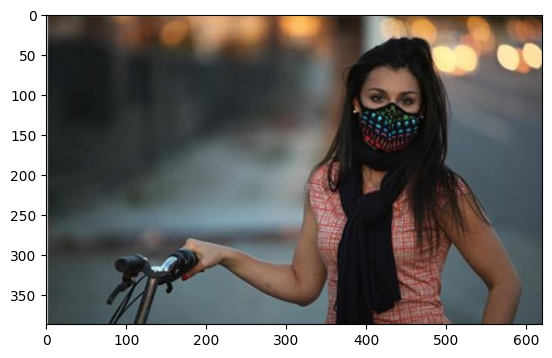

In [50]:
#displaying with mask image
img = mpimg.imread('/content/data/with_mask/with_mask_3322.jpg')
imgplot = plt.imshow(img)
plt.show()

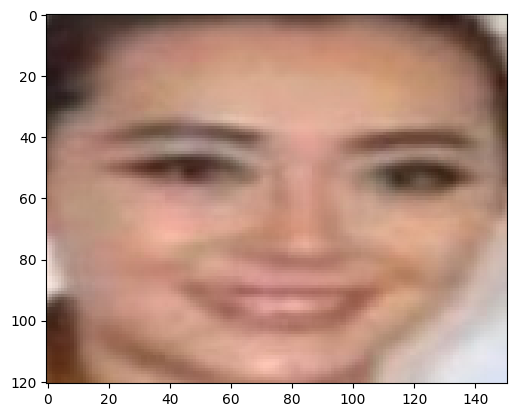

In [51]:
#displaying without mask image
img = mpimg.imread('/content/data/without_mask/without_mask_3736.jpg')
imgplot = plt.imshow(img)
plt.show()

**Image processing**

In [52]:
#converting images to numpy array
#with mask
with_mask_path = '/content/data/with_mask/'
data = []
for img_file in with_mask_files:
  image = Image.open(with_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)

#without mask
without_mask_path = '/content/data/without_mask/'

for img_file in without_mask_files:
  image = Image.open(without_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)



/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [53]:
type(data)

list

In [54]:
len(data)

7553

In [55]:
data[0]

array([[[ 24,  24,  24],
        [ 29,  29,  29],
        [ 26,  26,  26],
        ...,
        [ 25,  26,  28],
        [ 22,  23,  25],
        [ 19,  20,  22]],

       [[ 26,  26,  26],
        [ 28,  28,  28],
        [ 26,  26,  26],
        ...,
        [ 26,  28,  30],
        [ 21,  22,  24],
        [ 19,  20,  22]],

       [[ 25,  25,  25],
        [ 28,  28,  28],
        [ 25,  25,  25],
        ...,
        [ 24,  25,  27],
        [ 23,  24,  26],
        [ 21,  22,  24]],

       ...,

       [[247, 252, 255],
        [247, 254, 253],
        [246, 254, 251],
        ...,
        [ 48,  53,  58],
        [ 60,  66,  74],
        [ 52,  61,  70]],

       [[249, 252, 255],
        [248, 253, 255],
        [247, 253, 254],
        ...,
        [ 44,  50,  58],
        [ 46,  53,  64],
        [ 46,  56,  66]],

       [[250, 254, 253],
        [248, 252, 254],
        [249, 254, 255],
        ...,
        [ 42,  49,  58],
        [ 42,  50,  61],
        [ 32,  42,  54]]

In [56]:
type(data[0])

numpy.ndarray

In [57]:
data[0].shape

(128, 128, 3)

In [58]:
#converting image list(data) and label list to numpy arrays
X = np.array(data)
Y = np.array(labels)

In [59]:
type(X)

numpy.ndarray

In [60]:
type(Y)

numpy.ndarray

In [61]:
print(X.shape)
print(Y.shape)

(7553, 128, 128, 3)
(7553,)


In [62]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.2,random_state=2)

In [63]:
print(X.shape,X_train.shape,X_test.shape)

(7553, 128, 128, 3) (6042, 128, 128, 3) (1511, 128, 128, 3)


In [64]:
#scaling the data

X_train_scaled = X_train/255

X_test_scaled = X_test/255

In [65]:
X_train_scaled[0]

array([[[0.30196078, 0.30588235, 0.32156863],
        [0.31372549, 0.31764706, 0.33333333],
        [0.34901961, 0.35294118, 0.37254902],
        ...,
        [0.31372549, 0.29411765, 0.27843137],
        [0.2627451 , 0.25098039, 0.23137255],
        [0.24313725, 0.23137255, 0.21176471]],

       [[0.30588235, 0.30980392, 0.32156863],
        [0.31372549, 0.31764706, 0.32941176],
        [0.34117647, 0.34509804, 0.36078431],
        ...,
        [0.29411765, 0.2745098 , 0.25882353],
        [0.27843137, 0.26666667, 0.24705882],
        [0.27058824, 0.2627451 , 0.24313725]],

       [[0.31372549, 0.31372549, 0.32156863],
        [0.31764706, 0.31764706, 0.3254902 ],
        [0.32941176, 0.33333333, 0.34117647],
        ...,
        [0.2627451 , 0.24705882, 0.23137255],
        [0.30196078, 0.28627451, 0.27058824],
        [0.31372549, 0.30588235, 0.28627451]],

       ...,

       [[0.11372549, 0.05882353, 0.        ],
        [0.21960784, 0.16470588, 0.05882353],
        [0.46666667, 0

**Building CNN**

In [66]:
import tensorflow as tf
from tensorflow import keras


In [67]:
num_of_classes = 2
model = keras.Sequential()

model.add(keras.layers.Conv2D(32,kernel_size=(3,3),activation ='relu',input_shape=(128,128,3)))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))


model.add(keras.layers.Conv2D(64,kernel_size=(3,3),activation ='relu'))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Flatten())

model.add(keras.layers.Dense(128, activation='relu'))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(64, activation='relu'))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(num_of_classes, activation='sigmoid'))

In [68]:
#compile the CNN

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['acc'])

In [69]:
#traning the CNN
history = model.fit(X_train_scaled,Y_train,validation_split=0.1,epochs=5)

Epoch 1/5
170/170 [==============================] - 166s 970ms/step - loss: 0.4559 - acc: 0.8038 - val_loss: 0.2991 - val_acc: 0.8711
Epoch 2/5
170/170 [==============================] - 162s 952ms/step - loss: 0.2824 - acc: 0.8867 - val_loss: 0.2828 - val_acc: 0.8810
Epoch 3/5
170/170 [==============================] - 162s 952ms/step - loss: 0.2363 - acc: 0.9099 - val_loss: 0.2599 - val_acc: 0.8959
Epoch 4/5
170/170 [==============================] - 159s 933ms/step - loss: 0.1889 - acc: 0.9277 - val_loss: 0.2324 - val_acc: 0.9091
Epoch 5/5
170/170 [==============================] - 158s 929ms/step - loss: 0.1633 - acc: 0.9371 - val_loss: 0.2946 - val_acc: 0.8876


**Model Evaluation**

In [70]:
loss, accuracy = model.evaluate(X_test_scaled,Y_test)
print('Test Accuracy =',accuracy)

48/48 [==============================] - 11s 222ms/step - loss: 0.2520 - acc: 0.9087
Test Accuracy = 0.9086697697639465


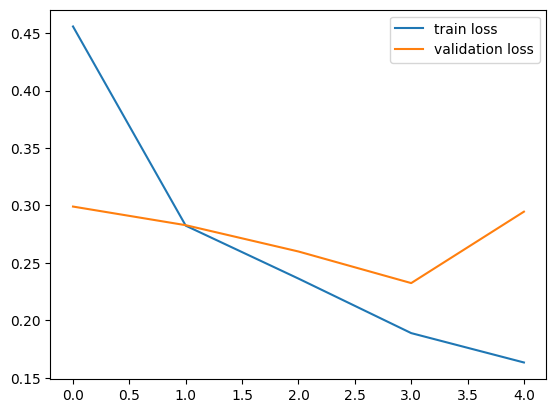

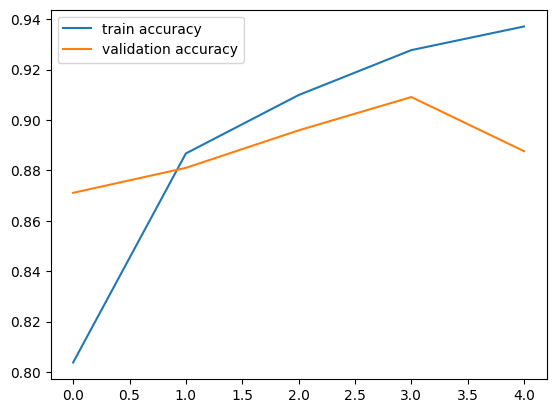

In [71]:
h =history

#plot loss value
plt.plot(h.history['loss'], label='train loss')
plt.plot(h.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

#plot accuracy value
plt.plot(h.history['acc'], label='train accuracy')
plt.plot(h.history['val_acc'], label='validation accuracy')
plt.legend()
plt.show()

**Predictiv System**

Path of the image to be predicted : /content/ragib_withmask_withglass.JPG


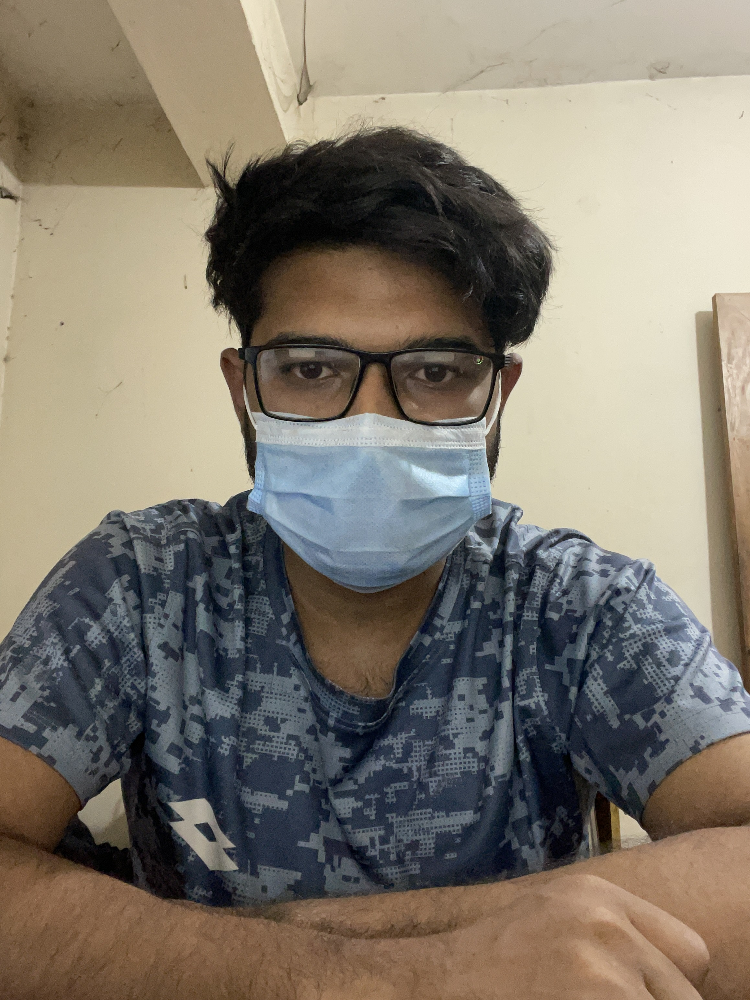

1/1 [==============================] - 0s 396ms/step
[[0.5269519  0.54352057]]
1
The person in the image is waring mask


In [73]:
input_image_path = input('Path of the image to be predicted : ')
input_image = cv2.imread(input_image_path)
cv2_imshow(input_image)
input_image_resized =cv2.resize(input_image,(128,128))
input_image_scaled = input_image_resized/255
input_image_reshaped = np.reshape(input_image_scaled,[1,128,128,3])
input_prediction = model.predict(input_image_reshaped)
print(input_prediction)
input_pred_label = np.argmax(input_prediction)
print(input_pred_label)
if input_pred_label == 1:
  print('The person in the image is waring mask')

else:
  print('The person in the image is not waring mask')